※본 커널은 캐글을 통해 공유된 "VinBigData Chest X-ray Abnormalities Detection"(https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection) Competition 의 Notebooks 중

"Finding data issues and mislabeled bounding boxes"(https://www.kaggle.com/bjoernholzhauer/finding-data-issues-and-mislabeled-bounding-boxes/) 의 내용을 기반으로 작성되었습니다.

# VinBigData Chest X-ray 대회에서 데이터 문제를 찾는 데 관심이 있는 이유는 무엇입니까?

[VinBigData 흉부 X-ray 이상 감지 대회] (https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/overview)에서는 경계 상자와 독립적으로 할당된 클래스에 대한 할당이 제공됩니다. 3 명의 방사선 전문의가 훈련 데이터로 작성했습니다. 테스트 데이터에는 2 명의 경험이 더 많은 방사선 전문의가 3 개의 초기 평가가 무엇인지 검토하는 추가 단계가 있습니다. 그런 다음 이 두 명의 경험이 더 많은 사람들이 의견 불일치에 대해 무엇을 할지 결정합니다 (그리고 그렇게 하는 동안 서로 논의할 수 있습니다). 프로세스는 [대회 개요 페이지에 링크 된 문서] (https://arxiv.org/pdf/2012.15029.pdf)에 설명되어 있습니다.
> 테스트 세트의 경우 5 명의 방사선 전문의가 2 단계 라벨링 프로세스에 참여했습니다. 첫 번째 단계에서 각 이미지는 3 명의 방사선 전문의가 독립적으로 주석을 달았습니다. 두 번째 단계에서 다른 2 명의 
더 높은 수준의 경험을 가진 방사선 전문의는 3 명의 이전 주석가의 주석을 검토하고 최종 레이블을 결정하기 위해 서로 소통했습니다. 초기 어노테이터 간의 불일치는 2 명의 검토자가 신중하게 논의하고 해결했습니다. 마지막으로, 그들의 의견에 대한 합의는 참고 근거가 될 것입니다.

([이 토론 스레드] (https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/211035)에서 이에 대한 추가 토론을 참조하십시오. 라벨링 문제).

** 요점 :** 학습 데이터는 테스트 데이터와 동일한 프로세스에서 생성되지 않으며 이미지가 테스트 데이터에 있었다면 수정되었을 수 있는 학습 데이터에서 많은 차이가 발생할 수 있습니다. 따라서 우리가 해결할 수 있는 문제를 해결하려고 노력하는 것이 합리적입니다.
<!--
# Why do we care about finding data issues in the VinBigData Chest X-ray competition?

In the [VinBigData Chest X-ray Abnormalities Detection competition](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/overview), we are given bounding boxes and their assignments to classes assigned independently by 3 radiologists as our training data. On the test data, there is an additional step, where 2 more experienced radiologists review what the 3 initial assessments were. These two more experienced ones then decide what to make of the disagreements (and can discuss with each other while doing so). The process is described on the [paper linked on the competition overview page](https://arxiv.org/pdf/2012.15029.pdf):
> For the test set, 5 radiologists involved into a two-stage labeling process. During the first stage, each image was independently annotated by 3 radiologists. In the second stage, 2 other
radiologists, who have a higher level of experience, reviewed the annotations of the 3 previous annotators and communicated with each other in order to decide the final labels. The disagreements among initial annotators were carefully discussed and resolved by the 2 reviewers. Finally, the consensus of their opinions will serve as reference ground-truth.

(see also some further discussion on this in [this discussion thread](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/211035), which also ends up discussing some data/labeling issues). 

**Bottom line:** our training data is not generated from the same process as the test data and a lot of the differences will be mistakes in the training data that would likely have been fixed, if the image were in the test data. Thus, it makes sense to try and fix the issues we can fix.
-->


In [1]:
!pip install shap

     |████████████████████████████████| 358kB 7.8MB/s 
  Created wheel for shap: filename=shap-0.38.1-cp36-cp36m-linux_x86_64.whl size=489400 sha256=cea34c3fdc8674ec0d8a108fa776e88edcee7f674f3656386f8e800169539ac4
  Stored in directory: /root/.cache/pip/wheels/a8/fb/e4/88012be41842b9be62ae18d82d1b1e880daf8539d1fef1fa00
Successfully built shap


# Import

In [ ]:
import os
import re
import pandas as pd
#from fastai.medical.imaging import *
#from fastai.vision.all import *
import numpy as np
from pathlib import Path
import matplotlib
import matplotlib.patches as ptc
from tqdm import tqdm # for getting a progress bar on loops
from sklearn.model_selection import KFold
import seaborn as sns
import matplotlib.pyplot as plt
import shap
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import shelve

In [ ]:
import joblib

# Data Overview

In [ ]:
dicom_meta = pd.read_csv('../input/eda-dicom-reading-vinbigdata-chest-x-ray/train_dicom_properties.csv.bz2').rename(columns={'file':'image_id'})
train = pd.read_csv('../input/vinbigdata-chest-xray-abnormalities-detection/train.csv')

# 1 Feature Analysis

## 1.1 알려진 실수

### 데이터에서 이미 알고 있는 실수는 무엇입니까?

일부 [포럼 토론](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/211035) 및 일부 [EDA 노트북](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#5.-How-big-do-bounding-boxes-tend-to-be-for-different-classes?-How-many-are-there?)는 경계 상자에 대한 적어도 일부 '대동맥 비대' 및 '심장 비대'레이블이 잘못되었다고 이미 제안했습니다. 나에게 이것은 이것이 방사선 전문의에 의한 오 평가가 덜한 것처럼 보이지만 오히려 소프트웨어 사용 문제로 새 경계 상자를 만들었지만 실수로 레이블을 지정한 이전 경계 상자와 동일한 클래스를 부여했습니다. 이 두 클래스의 경우 비교적 쉽게 볼 수 있습니다 ([데이터 문제 섹션](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#11.Possible-data-issues)의 [이 EDA 노트북](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#5.-How-big-do-bounding-boxes-tend-to-be-for-different-classes?-How-many-are-there?) ) 그러나 다른 접근 방식에서도 이러한 사례를 식별하는지 확인하는 것도 흥미로울 것입니다.
<!--
# What mistakes in the data do we already know?
Some of the [forum discussions](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/211035) and some [EDA notebooks](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#5.-How-big-do-bounding-boxes-tend-to-be-for-different-classes?-How-many-are-there?) already suggested that at least some 'aortic enlargement' and 'cardiomegaly' labels for bounding boxes are wrong. To me this looks like these were maybe less mis-assessments by the radiologists, but rather software usage issues, where they created a new bounding box, but accidentally gave it the same class as for the previous bounding box they had labelled. For these two classes this is relatively easy to see (see images in [data issues Section](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#11.Possible-data-issues) of [this EDA notebook](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#5.-How-big-do-bounding-boxes-tend-to-be-for-different-classes?-How-many-are-there?). However, it will also be interesting to see whether other approaches also identify these cases
-->


In [ ]:
# train 에서 'image_id', 'class_name', 'rad_id','class_id' 를 선택한다.
# train 에서 'image_id', 'class_name', 'rad_id' 로 group 하고 count 한다. 
# 'Number of records' 로 컬럼명을 변경한다.
bygroup = train[['image_id', 'class_name', 'rad_id','class_id']].copy()\
    .groupby(['image_id', 'class_name', 'rad_id']).count().reset_index()\
    .rename(columns={'class_id': 'Number of records'})

In [ ]:
# 결과 확인을 위해서 Number of records 수가 20개 이상인 것만 추출해 본다.
bygroup[bygroup['Number of records'] > 20]

,image_id,class_name,rad_id,Number of records
949,03e6ecfa6f6fb33dfeac6ca4f9b459c9,Nodule/Mass,R8,28
950,03e6ecfa6f6fb33dfeac6ca4f9b459c9,Nodule/Mass,R9,24
47695,c699f16ba0b86f474390da9515bcad7a,Nodule/Mass,R8,21
50064,d106ec9b305178f3da060efe3191499a,Nodule/Mass,R8,25
60006,fa109c087e46fe1ea27e48ce6d154d2f,Nodule/Mass,R8,26


In [ ]:
# class_name 이 'Aortic enlargement'(class_id=0) 또는 'Cardiomegaly'(class_id=3) 이고
# label_count 값이 2 인 것()을 선택한다.
strange_cases = bygroup.loc[ [ (cn[0] in ['Aortic enlargement', 'Cardiomegaly']) & cn[1]  \
                              for cn in zip(bygroup['class_name'].values, list(bygroup['Number of records']==2)) ], \
                            ['image_id', 'rad_id']]

# train 에 있는 class_id, rad_id, Bounding Box 정보를 연결한다.
strange_cases = pd.merge(train, strange_cases, on=['image_id', 'rad_id'], how='inner')
# 'image_id', 'rad_id', 'class_name' 순으로 정렬한다.
strange_cases = strange_cases.sort_values(['image_id', 'rad_id', 'class_name']).reset_index(drop=True)


In [ ]:
strange_cases.groupby(['image_id']).count().reset_index()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,24c408efe011f2d27322e93440221aa1,3,3,3,3,3,3,3
1,26555d1abc4576ef9e235aba96f4429e,2,2,2,2,2,2,2
2,2a3def0aa2b27bea4235348e5d4cf345,5,5,5,5,5,5,5
3,3ce8e5fe27fc9db53129cdbdd8de89de,2,2,2,2,2,2,2
4,6ed2ab0e4ba47734a7b2a47deff243c1,2,2,2,2,2,2,2
5,9fd7ae7f030dbd0185a3984704dcdc5d,2,2,2,2,2,2,2
6,a43d700412de5ab25b800bd283e1baa2,2,2,2,2,2,2,2
7,a71462e25ea94178b2ff97939d7af7ec,2,2,2,2,2,2,2
8,b1061d4cdf14dd101734a129b89a85de,4,4,4,4,4,4,4
9,b9374768fadad510f514c5b81b048881,3,3,3,3,3,3,3


In [ ]:
strange_cases[strange_cases['image_id']=='26555d1abc4576ef9e235aba96f4429e']

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
3,26555d1abc4576ef9e235aba96f4429e,Cardiomegaly,3,R9,661.0,1658.0,1598.0,2088.0
4,26555d1abc4576ef9e235aba96f4429e,Cardiomegaly,3,R9,926.0,1004.0,1227.0,1305.0


* Cardiomegaly(심비대) 는 중앙 아래쪽에 나타나므로 y_min, y_max 값으로 볼 때, 4번은 aortic enlagement(대동맥 비대)를 잘 못 판정된 것이다.

또한 `.dicom` 메타 데이터의 `PatientAge`가 잘못되었을 수 있다고 [알려졌습니다](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/208111). 내가 [탐색 데이터 분석을 했을 때](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#6.-What-is-in-the-.dicom-meta-data?), 나는 PatientAge가 000Y (+ 000D = 0 일?)로 주어진 839 .dicom 파일을 보았습니다. 이론적으로는 누락에 대한 또 다른 자리 표시 자이거나 실제로 0 세 (즉 <1 년- 낡은). 빈 문자열` ''`,`000` 및`NaN` 문자열이 있는 문제가 있습니다. 또한 일부 연령은 18 세 미만입니다. 001Y에서 017Y까지 107 개의 이미지가 있습니다. 분명히 일부 진단은 특정 연령에서 훨씬 더 가능성이 높기 때문에 이것은 분명히 흥미롭습니다. 데이터 세트를 만드는 방법을 설명하는 문서에서 모든 데이터는 성인의 데이터 여야 합니다.
> "수집 된 원시 데이터는 대부분 성인 PA-view CXR에 대한 것이지만, 가슴 이외의 신체 부위 이미지 (DICOM 태그가 일치하지 않음), 소아 스캔, 저품질 이미지 또는 측면과 같은 상당한 양의 이상 값도 포함되었습니다. CXR. […] 모든 이상치는 데이터 세트 […]에서 자동으로 제외되었습니다. "

그로 인해 포럼에 설명을 요청했고 응답은 이것이 데이터 문제라는 답을 받았습니다. 따라서 18 세 이상의 다른 연령대도 잘못된 것일 수 있습니다.

확실히 100 세가 훨씬 넘는 여러 연령대도 의심스러울 수 있습니다.
<!--
We have also [been told](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/208111) that `PatientAge` in the `.dicom` meta data may be wrong. When I [did some exploratory data analysis](https://www.kaggle.com/bjoernholzhauer/eda-dicom-reading-vinbigdata-chest-x-ray#6.-What-is-in-the-.dicom-meta-data?), I saw 839 .dicom files with PatientAge given as 000Y (plus 000D = 0 days?), which could in theory be yet another placeholder for missing or might really mean 0 years of age (i.e. < 1 year-old). There's the issue of there being empty strings `''`, `000` as well as `NaN` string. Additionally, some of the ages are below < 18 years, e.g. there's 107 images with 001Y to 017Y. This is obbviously interesting, because obviously some diagnoses are just much more likely at certain ages. From the paper describing the methods to create the dataset, it appears that all data should be from adults
> "The collected raw data was mostly of adult PA-view CXRs, but also included a significant amount of outliers such as images of body parts other than chest (due to mismatched DICOM tags), pediatric scans, low-quality images, or lateral CXRs. […] All outliers were automatically excluded from the dataset […]."

That prompted me to ask for clarification on the forum and the response suggested that these are data issues, which makes you wonder how many other ages above 18 may also be wrong.

Certainly, several of the ages substantially above 100 years may also be doubtful.
-->


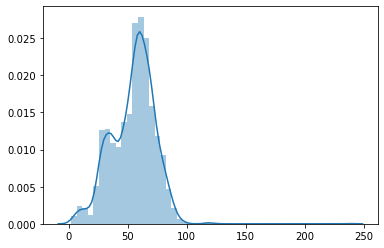

In [ ]:
# 환자 연령의 분포를 그린다.
def string_to_float_process(string):
    if (string=='') | (string=='000D') | (string=='000'):
        return float("NaN")
    else:
        return float(string)

PatientAge = [string_to_float_process(string) for string in dicom_meta['PatientAge'].replace(re.compile('Y$'), '') ]
sns.distplot(PatientAge);

* 환자 연력이 100세 이상 250까지 있는 것은 Outlier 일 것임. 그대로 사용할 수는 없음.

### 둘 이상의 레이블(label)이 있는 경계 상자(Bounding Box)

이들 중 상당수는 실제 데이터 문제가 아닐 수 있습니다. 종종 동일한 경계 상자에 많은 레이블이 지정됩니다. 경쟁 주최자에 따라 이것은 합법적입니다. [토론 스레드](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/212859#1161967)에서 지적했듯이 다음과 같이 말했습니다.
> 일부 조밀한 병변 영역에는 많은 레이블이 포함되어 있으며, 방사선 전문의는 상자를 만든 다음 해당 상자에 많은 레이블을 할당합니다.

유일한 질문은 결국 이러한 여러 레이블 중 일부가 우연인지 오류인지 여부입니다. 각 레이블 조합이 발생하는 빈도 목록을 살펴 보겠습니다.
<!--
# Bounding boxes with more than one label
A lot of these are probably not really data issues. Quite often the same bounding boxes are given a lot of labels. As per the competition host this is legitimate. As pointed out in a [discussion thread](https://www.kaggle.com/c/vinbigdata-chest-xray-abnormalities-detection/discussion/212859#1161967), they have stated:
> Some dense lesion area contains many labels, our radiologists created a box then assign many labels to that box.

The only question is whether some of these multiple labels are accidental or erroneous, after all. Let's have a look at a list of how often each combination of labels occurs:
-->


In [ ]:
tmp1 = train.copy()
tmp_cols = ['image_id', 'rad_id', 'x_min', 'x_max', 'y_min', 'y_max']

# tmp1 에서 tmp_cols + 'class_id' 를 취하고
# tmp_cols 로 그룹핑하고
# class_id 갯수를 세고
# index 를 reset 하고
# 'Number of records' 로 컬럼명을 변경한다.
tmp1 = tmp1[tmp_cols+[ 'class_id']]\
    .groupby(tmp_cols)\
    .count()\
    .reset_index()\
    .rename(columns={'class_id': 'Number of records'})

# train 에 있는 정보를 tmp_cols 를 사용하여 연결하고
# tmp_cols 로 정렬한 후
# index 를 reset 한다.
#tmp1 = tmp1[tmp1['Number of records']>1]
tmp1 = pd.merge(train.copy(), tmp1, 
                on=tmp_cols, 
                how='inner')\
    .sort_values(tmp_cols+['class_id'])\
    .reset_index(drop=True)

# class_id+calss_name 으로 만든 class_id_name 컬럼을 추가한다.
tmp1['class_id_name'] = [str(row['class_id']) + ': ' + row['class_name'] for idx, row in tmp1.iterrows()]

# tmp1 을 tmp_cols 로 그룹핑한 것에서 'class_id' (즉, 'Number of records') 값을 취하고 
# grouprank 를 구하여 컬럼을 추가한다.
tmp1["grouprank"] = tmp1.groupby(tmp_cols)['class_id']\
    .rank(method="first", ascending=True)\
    .astype(np.int8)

# tmp_cols + 'Number of records' 를 index 로 사용하고
# grouprank 를 columns 로 하고, class_id_name 을 values 로 해서 pivot 하고
# class_ 를 덧붙이고
# index 를 reset 한다.
tmp1 = tmp1.pivot(index=tmp_cols+['Number of records'],
           columns='grouprank',values='class_id_name')\
    .add_prefix('class_')\
    .reset_index()
   
def isNaN(string):
    return string != string

#
tmp1['class_combinations'] = [ ' + '.join([  row['class_'+str(i)]  \
                                           for i in range(1,6) \
                                           if (not( isNaN(row['class_'+str(i)])))])  \
                              for idx, row in tmp1.iterrows() ]

pd.set_option('display.max_rows', 1000)

#
tmp1['class_combinations'].value_counts()

0: Aortic enlargement                                                                                   7140
3: Cardiomegaly                                                                                         5424
13: Pulmonary fibrosis                                                                                  3534
11: Pleural thickening                                                                                  3340
8: Nodule/Mass                                                                                          2044
9: Other lesion                                                                                         1587
7: Lung Opacity                                                                                         1389
10: Pleural effusion + 11: Pleural thickening                                                           1285
10: Pleural effusion                                                                                    1121
5: ILD             

가장 일반적인 것을 볼 수 있듯이 하나 이상의 레이블이 있을 때 단일 경계 상자에 레이블이 지정됩니다. **10 : 흉막 삼출 + 11 : 흉막 비후** (1285 사례) 다음에 **6 : 침윤 + 13 : 폐 섬유증** (318 건), **6 : 침윤 + 7 : 폐 불투명도** (216 건). 이것이 "밀도 병변 영역"에 해당합니까?

일부 조합은 **0 : 대동맥 비대 + 3 : 심비대**와 같은 명백한 실수이며 **3 : 심비대 + 8 : 결절 / 질량**과 같이 그럴듯 해 보이지 않습니다.
<!--
As we can see the most common thing a single bounding box is labelled as when there's more than one label is **10: Pleural effusion + 11: Pleural thickening** (1285 cases) followed by **6: Infiltration + 13: Pulmonary fibrosis** (318 cases), and **6: Infiltration + 7: Lung Opacity** (216 cases). Does this fall under "dense lesion areas"?

Some of the combinations are clearly mistakes such as **0: Aortic enlargement + 3: Cardiomegaly** and do not seem very plausible such as **3: Cardiomegaly + 8: Nodule/Mass**.
-->


## 1.2 접근 방법

### 문제(issues)와 레이블이 잘못 지정된 경계 상자를 찾기 위한 이 노트북의 아이디어는 무엇입니까?
<!--
# What's the idea in this notebook for finding the issues and mislabeled bounding boxes?
-->


우리는 무엇을 다루려고합니까? 두 가지 가능한 질문은 다음과 같습니다.
* 기존 경계 상자에 대한 레이블이 잘못 되었습니까 (메트릭 : 경계 상자의 특성을 고려하여 이 레이블을 예측합니까)? 이것은 명백한 질문입니다. 인간이 수동으로 한 일을 좀 더 체계적으로 수행 할 수 있는지 여부입니다. 믿을 수없는 경계 상자 레이블을 식별합니다.이 경우 경계 상자의 위치가 옳다고 가정하고 레이블이 잘못 지정되었는지 확실하지 않습니다.
* 또 다른 질문은 특정 경계 상자가 잘못된 위치에 있는지 여부입니다. 우리는 다른 방사선 전문의가 이 라벨을 겹치는 상자에 대해 부여하는지 아니면 겹치는 상자를 가지고 있는지를 살펴보면 확인할 수 있습니다. 메트릭은 IOU 일 수 있습니다.

이 노트북에서는 LightGBM을 사용하여 잘못 분류된 경계 상자를 찾으려고 합니다. 경계 상자에 대한 'class_id'를 분류하는 경우 범주형 교차 엔트로피 손실이 확실한 선택이지만 다중 클래스 focal loss가 대안이 될 수 있습니다. 분명히 하이퍼 파라미터를 최적화하고 성능을 평가할 때 누수 문제를 피하기 위해 `image_id`로 교차 검증을 해야 합니다. 반면에, 우리는 'rad_id'를 기능으로 **멀리** 하고 싶습니다. 이는 훌륭한 기능이 될 수 있지만 방사선 전문의의 실수를 반복하도록 모델을 훈련시키고 싶지는 않습니다.
<!--
# What's the idea in this notebook for finding the issues and mislabeled bounding boxes?

What are we trying to address? Two possible questions are:
* Are the labels wrong for an existing bounding box (metrics: Do we predict this label given the characteristics of the bounding box? This is an obvious question is whether we can more systematically do what humans did there more or less manually: identify implausible bounding box labels. In that case we make the assumption that the position of bounding boxes are right, we are just not sure whether they are mislabeled.
* Another question could be whether certain bounding boxes are in the wrong place. We could look at that by looking at whether other radiologists give this label for overlapping boxes or even have overlapping boxes, at all. A metric could be IOU.

In this notebook I use LightGBM to try and find misclassified bounding boxes. For classifying the `class_id` for a bounding box, categorical cross entropy loss is one obvious choice, but multi-class focal loss could be an alternative. Obviously, when we optimize hyperparameters and evaluate performance we need to do cross-validation by `image_id` to avoid issues with leakage. On the other hand, we want to **stay away** from `rad_id` as a feature - it may well be a great feature, but we don't want to train a model to repeat a radiologist's mistakes.
-->


### 아직 시도하지 않은 다른 가능한 접근 방식
<!--
# Other possible approaches I did not try, yet
-->


또는 'image_id' 임베딩을 포함하거나 실제 이미지를 입력으로 사용할 수도 있는 신경망을 사용해 볼 수도 있습니다. 한 가지 가능성은 단순히 분류 모델이고 이를 다중 레이블 문제로 본 다음 모델이 가장 "놀라운"것으로 간주하는 레이블 (가장 혼란스러운 예측)을 찾는 것입니다.

우리는 또한 IOU 또는 다른 측정 항목과 같은 이미지를 라벨링 한 다른 두 명의 방사선과 의사와 비교하여 평균적으로 예측할 수 있습니다. 경계 상자에 대해 실제로 라벨링 된 클래스를 입력으로 사용할 수 있습니다.
<!--
Alternatively, we could try neural networks, where we could even have an `image_id` embedding or even use the actual image as an input. One possibility would simply be a classification model and to look at it as a multi-label problem - and then look for the labels the model considers the most "surprising" (aka most confused predictions).

We could also try to predict IOU or some other metric on average vs. the two other radiologists that labelled the same image - possibly with the actually labelled class for the bounding box as an input. 
-->

### 이러한 접근 방식의 다른 가능한 사용
<!--
# Other possible uses of these approaches
-->

나에게 떠오른 또 다른 생각은 우리가 모델에서 얻은 예측을 매우 다른 접근 방식을 사용하여 타당성에 대해 확인 할 수 있다는 것입니다. 물론, 실제 이미지를 사용하여 비전 모델에서 모델 예측을 재정의하려면 이러한 모델이 얼마나 회의적이어야 하는지 신중하게 생각해야 하지만 신중하게 조정하면 매우 유용할 수 있습니다.
<!--
# Other possible uses of these approaches
Another thought that occured to me is that we could dobule-check the predictions we get from models for plausibility using a very different approach. Sure, you'd have to think quite carefully how skeptical these models would have to be for you to override a model prediction from a vision model using the actual image, but with some careful tuning this might very well be useful.
-->


## 1.3 Feature engineering

* Create a list of classes and a dictionary

In [ ]:
# class 별로 record 수를 파악한다.
classes = train[['class_id', 'class_name', 'rad_id']]\
    .groupby(['class_id', 'class_name'])\
    .count()\
    .rename(columns={'rad_id': 'Number of records'})\
    .reset_index()

# label_dict 을 만든다.
for index, row in classes.iterrows():
    if index==0:
        label_dict = {row['class_id']: row['class_name']}
    else:
        label_dict.update({row['class_id']: row['class_name']})


### 1.3.1 DICOM_META Merge and Scaling

In [ ]:
# train 에 dicom_meta 를 merge 한다.
train = pd.merge(train, dicom_meta, on='image_id', how='left')

# 이미지 별로 해상도가 다르므로 scale 을 0~1 로 맞춘다.
train['x_max'] = train['x_max']/train['Columns']
train['x_min'] = train['x_min']/train['Columns']
train['y_max'] = train['y_max']/train['Rows']
train['y_min'] = train['y_min']/train['Rows']
train['width'] = (train['x_max']-train['x_min'])
train['height'] = (train['y_max']-train['y_min'])
train['area'] = train['height']*train['width']
train['x_center'] = (train['x_max']+train['x_min'])/2
train['y_center'] = (train['y_max']+train['y_min'])/2

#### 추가 : 이미지 해상도 분포

In [ ]:
sns.jointplot(x='Columns',y='Rows' ,data=train, kind='reg');

NameError: ignored

### 1.3.2 BBOX 분포 확인

* 다음 차트들에서 y 값이 작을 수록 위쪽이므로 위아래를 뒤집어서 해석해야 함 

#### BBOX 크기 분포

In [ ]:
def draw_bbox_size(cid):
    tmp_df = train[train['class_id']==cid].copy()
    g = sns.jointplot(x='width', y='height', data=tmp_df, kind='reg', xlim=(0,1), ylim=(0,1));

##### 추가 0 : aortic enlargement(대동맥 비대) 에 대한 BBOX 크기 분포

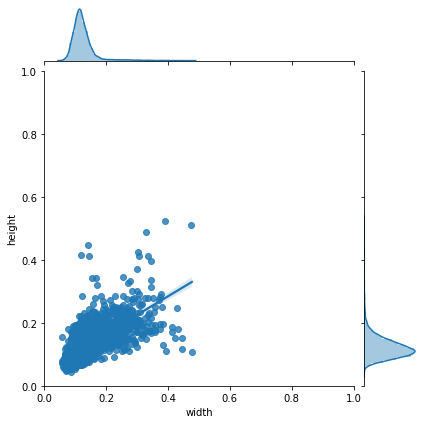

In [ ]:
draw_bbox_size(0)

##### 추가 2 : Calcification(석회화) 에 대한 BBOX 크기 분포

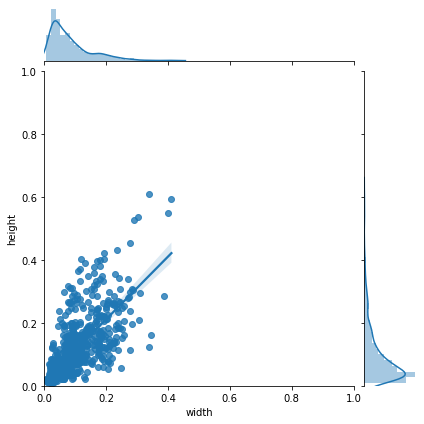

In [ ]:
draw_bbox_size(2)

##### 추가 3 : Cardiomegaly(심비대) 에 대한 BBOX 크기 분포

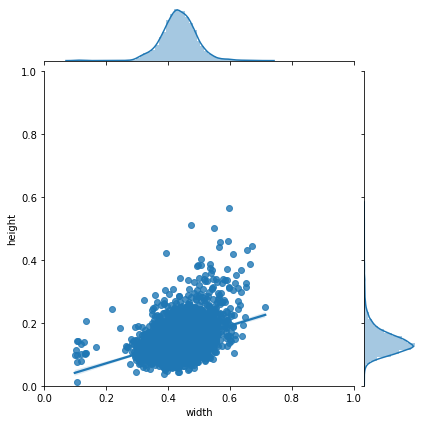

In [ ]:
draw_bbox_size(3)

##### 추가 8 : Nodule/Mass(결절/붕괴) 에 대한 BBOX 크기 분포

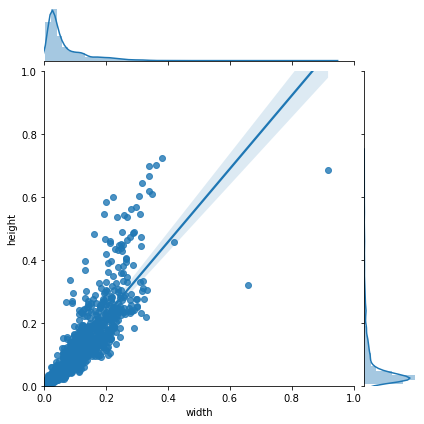

In [ ]:
draw_bbox_size(8)

##### 추가 11 : Pleural thickening(흉막 비후) 에 대한 BBOX 크기 분포

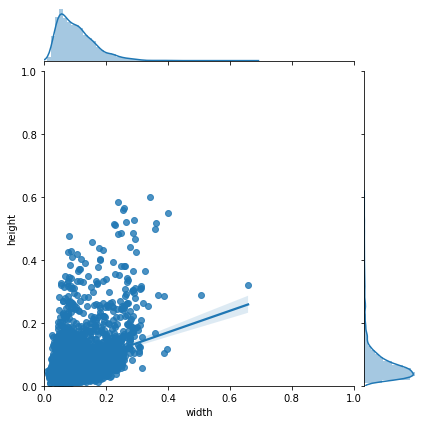

In [ ]:
draw_bbox_size(11)

##### 나머지 : BBOX 크기 분포

In [ ]:
draw_bbox_size(1)

NameError: ignored

In [ ]:
draw_bbox_size(4)

NameError: ignored

In [ ]:
draw_bbox_size(5)

In [ ]:
draw_bbox_size(6)

In [ ]:
draw_bbox_size(7)

In [ ]:
draw_bbox_size(9)

In [ ]:
draw_bbox_size(10)

In [ ]:
draw_bbox_size(12)

In [ ]:
draw_bbox_size(13)

#### BBOX 위치 분포

In [ ]:
def draw_bbox_pos(cid):
    tmp_df = train[train['class_id']==cid].copy()
    g = sns.jointplot(x='x_center', y='y_center', data=tmp_df, kind='reg', xlim=(0,1), ylim=(0,1));

##### 추가 0 : aortic enlargement(대동맥 비대) 에 대한 BBOX 위치 분포

In [ ]:
draw_bbox_pos(0)

##### 추가 3 : Cardiomegaly(심비대) 에 대한 BBOX 위치 분포

In [ ]:
draw_bbox_pos(3)



```
# 코드로 형식 지정됨
```

##### 나머지 : BBOX 위치 분포

In [ ]:
draw_bbox_pos(1)

In [ ]:
draw_bbox_pos(2)

In [ ]:
draw_bbox_pos(4)

In [ ]:
draw_bbox_pos(5)

In [ ]:
draw_bbox_pos(6)

In [ ]:
draw_bbox_pos(7)

In [ ]:
draw_bbox_pos(8)

In [ ]:
draw_bbox_pos(9)

In [ ]:
draw_bbox_pos(10)

In [ ]:
draw_bbox_pos(11)

In [ ]:
draw_bbox_pos(12)

In [ ]:
draw_bbox_pos(13)

#### Class_id = 0 인 것에 대한 개별 이미지 확인

In [ ]:
dataset_dir = '../input/vinbigdata-chest-xray-abnormalities-detection'

In [ ]:
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
import cv2
from random import randint

In [ ]:
finding_df = train[train['class_name'] != 'No finding']
class_ids = finding_df['class_id'].unique()

# map label_id to specify color
label2color = {class_id:[randint(0,255) for i in range(3)] for class_id in class_ids}
thickness = 3
scale = 4

In [ ]:
def dicom2array(path, voi_lut=True, fix_monochrome=True):
    dicom = pydicom.read_file(path)
    # VOI LUT (if available by DICOM device) is used to
    # transform raw DICOM data to "human-friendly" view
    if voi_lut:
        data = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        data = dicom.pixel_array
    # depending on this value, X-ray may look inverted - fix that:
    if fix_monochrome and dicom.PhotometricInterpretation == "MONOCHROME1":
        data = np.amax(data) - data
    data = data - np.min(data)
    data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

In [ ]:
abnormal_df = train[train['class_id']!=14]

In [ ]:
def plot_img(img, size=(8, 8), is_rgb=True, title="", cmap='gray'):
    plt.figure(figsize=size)
    plt.imshow(img, cmap=cmap)
    plt.suptitle(title)
    plt.show()

def draw_image(img_id, class_id):
    img_path = f'{dataset_dir}/train/{img_id}.dicom'
    print(f'img_id={img_path}')

    img = dicom2array(path=img_path)
    img = cv2.resize(img, None, fx=1/scale, fy=1/scale)
    img = np.stack([img, img, img], axis=-1)

    boxes = train_org.loc[(train_org['image_id'] == img_id) & (train_org['class_id'] == class_id), ['x_min', 'y_min', 'x_max', 'y_max']].values/scale
    labels = train_org.loc[(train_org['image_id'] == img_id) & (train_org['class_id'] == class_id), ['class_id']].values.squeeze()
    print(f'lavels={labels}')
          
    if (labels.size==1):
        label_id = labels
        box = boxes[0]
        color = label2color[0]
        img = cv2.rectangle(
            img,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, thickness
        )
    else:
        for label_id, box in zip(labels, boxes):
            color = label2color[label_id]
            img = cv2.rectangle(
                img,
                (int(box[0]), int(box[1])),
                (int(box[2]), int(box[3])),
                color, thickness
            )
    img = cv2.resize(img, (500,500))

    plot_img(img)

In [ ]:
abnormal_df

주석 부적합 - 예시 1¶

In [ ]:
abnormal_df[(abnormal_df['class_id']==0) & (abnormal_df['width']>0.4)]

In [ ]:
img_id = '3ce8e5fe27fc9db53129cdbdd8de89de'
draw_image(img_id, 0)

In [ ]:
abnormal_df[abnormal_df['image_id']==img_id]

image_id = 3ce8e5fe27fc9db53129cdbdd8de89de 에서 R8 이 1222 에서 Cardiomegaly(심장 비대) 를 Aortic enlargement(대동맥 비대) 로 잘 못 표시함

주석 부적합 - 예시 2

In [ ]:
img_id = 'edc6ab1b2233143d011edf7706c32b6c'
draw_image(img_id, 0)

In [ ]:
img_id = '2c42c054b21c3a7ff91f13e3b43e5418'
draw_image(img_id, 0)

In [ ]:
abnormal_df[abnormal_df['image_id']==img_id]

image_id = 2c42c054b21c3a7ff91f13e3b43e5418 에서 R10 이 18577 에서 Cardiomegaly(심장 비대) 를 Aortic enlargement(대동맥 비대) 로 잘 못 표시함

In [ ]:
img_id = 'c93d43336ef6d28348794b5ced1886a4'
draw_image(img_id, 0)

상행 대동맥의 위치가 아닌곳에 BBOX 가 그려져 있음

In [ ]:
img_id = 'a43d700412de5ab25b800bd283e1baa2'
draw_image(img_id, 0)

In [ ]:
abnormal_df[abnormal_df['image_id']==img_id]

image_id = 8db8173d076bab7a3fcc6656a0b3c15a 에서 R9 가 26855 에서 Cardiomegaly(심장 비대) 를 Aortic enlargement(대동맥 비대) 로 잘 못 표시함

In [ ]:
img_id = '2a96255deafcf2f24bf9f266e1c12633'
draw_image(img_id, 0)

상행 대동맥의 위치가 아닌곳에 BBOX 가 그려져 있음. 광범위한 영역을 표시하고 있음. 다른 병변일 것 같음

In [ ]:
img_id = 'd19b822e1f1cb392d172d1ee4fa73005'
draw_image(img_id, 0)

상행 대동맥의 위치가 아닌곳에 BBOX 가 그려져 있음. 광범위한 영역을 표시하고 있음. 다른 병변일 것 같음

In [ ]:
img_id = '6c8d15e1aadce8cc5dc0a4b719818a4c'
draw_image(img_id, 0)

상행 대동맥의 위치가 아닌곳에 BBOX 가 그려져 있음. 광범위한 영역을 표시하고 있음. 다른 병변일 것 같음

In [ ]:
img_id = '221d68705e17ec11935e410fcc483b0f'
draw_image(img_id, 0)

상행 대동맥의 위치가 아닌곳에 BBOX 가 그려져 있음. 광범위한 영역을 표시하고 있음. 다른 병변일 것 같음

### 1.3.3 Feature 추가 : other

In [ ]:
# In this cell, we create a feature for how many other classes a radiologist has already assigned 
# for the same image.

tmp1 = pd.merge(train, train, on=['image_id', 'rad_id'], how='left').fillna(0)
#tmp1 = tmp1[ (tmp1['class_id_x']!=tmp1['class_id_y']) | (tmp1['x_min_x']!=tmp1['x_min_y']) | (tmp1['x_max_x']!=tmp1['x_max_y']) | (tmp1['y_min_x']!=tmp1['y_min_y']) | (tmp1['y_max_x']!=tmp1['y_max_y'])]

# feature 추가 : other
tmp_cols = ['image_id', 'rad_id', 'class_id_x', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x']
tmp1 = tmp1[ tmp_cols + ['class_id_y', 'x_max_y']]\
    .groupby(tmp_cols+['class_id_y'])\
    .count()\
    .reset_index()\
    .pivot(index=tmp_cols,
           columns='class_id_y', values='x_max_y')\
    .add_prefix('other_')\
    .reset_index()\
    .rename(columns={'class_id_x':'class_id',
                     'class_id_x': 'class_id',
                     'x_min_x': 'x_min',
                     'y_min_x': 'y_min',
                     'x_max_x': 'x_max',
                     'y_max_x': 'y_max'})

train = pd.merge(train, tmp1, 
                 on=['image_id', 'rad_id', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max'],
                 how='left')
train[['other_'+str(i) for i in range(15)]] = train[['other_'+str(i) for i in range(15)]]\
    .fillna(0)\
    .astype(np.int)

# Finally, we subtract the extra count of +1 for each label itself (when we want to predict it, we
# do not want to have a feature that leaks the label, which it otherwise would).
for idx, row in train.iterrows():
    if row['class_id']<14:        
        train['other_' + str(row['class_id'])].values[idx] += -1

In [ ]:
train.shape

### 1.3.4 Features 추가 : n_class, area_class

#### Features based on where bounding boxes for a class tend to be

100%|██████████| 67914/67914 [00:15<00:00, 4338.59it/s]


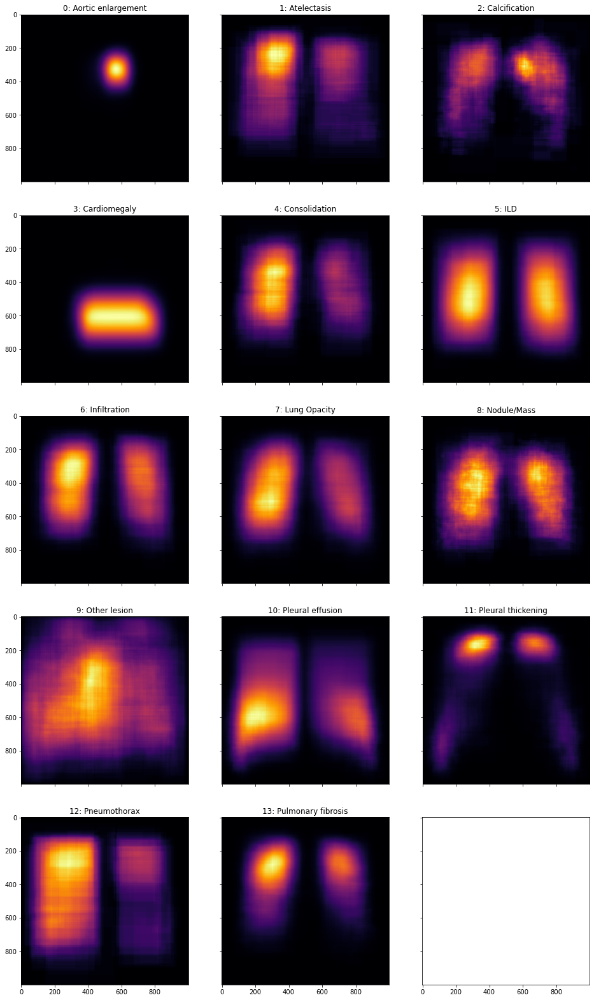

In [ ]:
# x, y 위치를 1/1000 로 쪼개서 구분한다.
# BBOX 에 속하는 부분은 +1 한다.
locations = np.zeros((14, 1000, 1000))
for index, row in tqdm(train.iterrows(), total=train.shape[0]):
    if row['class_id']<14:
        locations[row['class_id'], 
                  ((np.round(row['y_min'],3)*1000).astype(np.int)):((np.round(row['y_max'],3)*1000).astype(np.int)), 
                  ((np.round(row['x_min'],3)*1000).astype(np.int)):((np.round(row['x_max'],3)*1000).astype(np.int))] += 1
        
# feature 추가 : n_class
classcounts = train[['image_id', 'rad_id', 'class_id','class_name']]\
    .groupby(['image_id', 'rad_id', 'class_id'])\
    .count()\
    .reset_index()\
    .pivot(index=['image_id', 'rad_id'], columns='class_id', values='class_name')\
    .rename(columns={i:'n_class'+str(i) for i in range(15)})\
    .fillna(0)

# feature 추가 : area_class
classareas = train[['image_id', 'rad_id', 'class_id','area']]\
    .groupby(['image_id', 'rad_id', 'class_id'])\
    .sum()\
    .reset_index()\
    .pivot(index=['image_id', 'rad_id'], columns='class_id', values='area')\
    .rename(columns={i:'area_class'+str(i) for i in range(15)})\
    .fillna(0)

train = pd.merge( pd.merge( train, classcounts, on=['image_id', 'rad_id'], how='left'), 
                  classareas, on=['image_id', 'rad_id'], how='left')
train = train[train['class_id']!=14]

classes = train[['class_id', 'class_name', 'rad_id']]\
    .groupby(['class_id', 'class_name'])\
    .count()\
    .rename(columns={'rad_id': 'Number of records'})\
    .reset_index()

for index, row in classes.iterrows():
    if index==0:
        label_dict = {row['class_id']: row['class_name']}
    else:
        label_dict.update({row['class_id']: row['class_name']})
        
f, axs = plt.subplots(5, 3, sharey=True, sharex=True, figsize=(16,28));

for class_id in range(14):
    axs[class_id // 3, class_id - 3*(class_id // 3)].imshow(locations[class_id], cmap='inferno', interpolation='nearest');
    axs[class_id // 3, class_id - 3*(class_id // 3)].set_title(str(class_id) + ': ' + label_dict[class_id])
    
plt.show();

### 1.3.5 Features 추가 : overlap

In [ ]:
# Let's zero out really low counts (<=3) - especialyl to avoid target leakage
for class_id in range(14):
    for x in range(1000):
        for y in range(1000):
            if locations[class_id,x,y]<=3:
                locations[class_id,x,y] = 0

In [ ]:
# feature 추가 : overlap
for class_id in range(14):
    train['overlap'+str(class_id)] = 0
    
for index, row in tqdm(train.iterrows(), total=train.shape[0]):    
    for class_id in range(14):
        train.loc[index, 'overlap'+str(class_id)] = np.mean( locations[class_id, int(np.floor(1000*row['x_min'])):int(np.ceil(1000*row['x_max'])), int(np.floor(1000*row['y_min'])):int(np.ceil(1000*row['y_max']))] )
        
#overlaps = ['overlap'+str(class_id) for class_id in range(14)]
#[ (class_id, train[overlaps[class_id]].values[idx]) for idx, class_id in enumerate(train['class_id'].values) if (class_id!=14) & (train[overlaps[class_id]].values[idx]>0)]        

100%|██████████| 36096/36096 [04:42<00:00, 127.56it/s]


### 1.3.6 eatures 추가 : class_id, iou

#### Creating our features

이제 우리는 동일한 이미지를 본 다른 두 방사선과 의사의 말을 기반으로 한 특징을 얻습니다.
<!--
Now we get to features based what the other two radiologists said that looked at the same image:
-->

In [ ]:
def bbox_overlap(bbox1, bbox2):
    area1 = (bbox1['x_max']-bbox1['x_min'])*(bbox1['y_max']-bbox1['y_min'])
    area2 = (bbox2['x_max']-bbox2['x_min'])*(bbox2['y_max']-bbox2['y_min'])
    intersection = max(0, min(bbox1['x_max'], bbox2['x_max']) - max(bbox1['x_min'], bbox2['x_min'])) * max(0, min(bbox1['y_max'], bbox2['y_max']) - max(bbox1['y_min'], bbox2['y_min']))
    return intersection / ( area1 + area2 - intersection)


In [ ]:
tmp1 = pd.merge(train, train, on='image_id', how='inner')

In [ ]:
# feature 추가 : class_id
# Feature counting other classes assigne by the other two radiologists reviewing the image
class_counts = tmp1.loc[ (tmp1['rad_id_x']!=tmp1['rad_id_y']), ['image_id', 'rad_id_x', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x', 'rad_id_y']]\
    .groupby(['image_id', 'rad_id_x', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x'])\
    .count()\
    .reset_index()\
    .rename(columns={'rad_id_x': 'rad_id', 'class_id_x': 'class_id', 'x_min_x': 'x_min', 'x_max_x':'x_max', 'y_min_x': 'y_min', 'y_max_x': 'y_max', 'rad_id_y': 'class_count'})\
    .pivot(index=['image_id', 'rad_id', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max'], columns='class_id_y', values='class_count')\
    .fillna(0)\
    .reset_index()

tmp1 = tmp1[ (tmp1['rad_id_x']!=tmp1['rad_id_y']) & (tmp1['class_id_x']!=14)  & (tmp1['class_id_y']!=14)]
tmp1 = tmp1[['image_id', 'rad_id_x', 'rad_id_y', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x', 'x_min_y', 'y_min_y', 'x_max_y', 'y_max_y']]

# Derive intersection-over-union vs. other bounding boxes by the other radiologists
tmp1['iou'] = [bbox_overlap({'x_min': row['x_min_x'], 'x_max': row['x_max_x'], 'y_min':row['y_min_x'], 'y_max':row['y_max_x']}, {'x_min': row['x_min_y'], 'x_max': row['x_max_y'], 'y_min':row['y_min_y'], 'y_max':row['y_max_y']}) for idx, row in tmp1.iterrows()]

# What is the maximum IOU?
maxiou = tmp1[['image_id', 'rad_id_x', 'rad_id_y', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x', 'iou']]\
    .groupby(['image_id', 'rad_id_x', 'rad_id_y', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x'])\
    .max()\
    .reset_index()\
    .rename(columns={'rad_id_x': 'rad_id', 'class_id_x': 'class_id', 'x_min_x': 'x_min', 'x_max_x':'x_max', 'y_min_x': 'y_min', 'y_max_x': 'y_max'})

# What is the sum of IOU?
sumiou = tmp1[['image_id', 'rad_id_x', 'rad_id_y', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x', 'iou']]\
    .groupby(['image_id', 'rad_id_x', 'rad_id_y', 'class_id_x', 'class_id_y', 'x_min_x', 'y_min_x', 'x_max_x', 'y_max_x'])\
    .sum()\
    .reset_index()\
    .rename(columns={'rad_id_x': 'rad_id', 'class_id_x': 'class_id', 'x_min_x': 'x_min', 'x_max_x':'x_max', 'y_min_x': 'y_min', 'y_max_x': 'y_max'})

tmp_cols = ['image_id', 'rad_id', 'class_id', 'class_id_y', 'x_min', 'y_min', 'x_max', 'y_max']

# feature 추가 : maxsumiou, minsumiou, meansumiou, maxmaxiou, minmaxiou, meanmaxiou
# Take maximum or min or mean over the two other radiologists for these two metrics.
maxsumiou = sumiou[tmp_cols+['iou']].groupby(tmp_cols).max().reset_index()
minsumiou = sumiou[tmp_cols+['iou']].groupby(tmp_cols).min().reset_index()
meansumiou = sumiou[tmp_cols+['iou']].groupby(tmp_cols).mean().reset_index()
maxmaxiou = maxiou[tmp_cols+['iou']].groupby(tmp_cols).max().reset_index()
minmaxiou = maxiou[tmp_cols+['iou']].groupby(tmp_cols).min().reset_index()
meanmaxiou = maxiou[tmp_cols+['iou']].groupby(tmp_cols).mean().reset_index()

tmp_cols = ['image_id', 'rad_id', 'class_id', 'x_min', 'y_min', 'x_max', 'y_max']
maxsumiou = maxsumiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'maxsumiou'+str(i) for i in range(14)})
minsumiou = minsumiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'minsumiou'+str(i) for i in range(14)})
meansumiou = meansumiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'meansumiou'+str(i) for i in range(14)})
maxmaxiou = maxmaxiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'maxmaxiou'+str(i) for i in range(14)})
minmaxiou = minmaxiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'minmaxiou'+str(i) for i in range(14)})
meanmaxiou = meanmaxiou\
    .pivot(index=tmp_cols, columns='class_id_y', values='iou')\
    .fillna(0)\
    .reset_index()\
    .rename(columns={i:'meanmaxiou'+str(i) for i in range(14)})

train = pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(pd.merge(train,
    class_counts, on=tmp_cols, how='left'),
    maxsumiou, on=tmp_cols, how='left'),
    minsumiou, on=tmp_cols, how='left'),
    meansumiou,on=tmp_cols, how='left'),
    maxmaxiou, on=tmp_cols, how='left'),
    minmaxiou, on=tmp_cols, how='left'),
    meanmaxiou,on=tmp_cols, how='left')
train = train[train['class_id']!=14].fillna(0)
train

In [ ]:
train.shape

(36096, 195)

In [ ]:
#PatientAge, PatientSex, PatientSize, PatientWeight
#list_of_ages = [string_to_float_process(string) for string in train_files['PatientAge'].replace(re.compile('Y$'), '') ]
#int(train['PatientAge'])

def string_to_float_process(string):
    if (string=='') | (string=='000D') | (string=='000'):
        return float("NaN")
    else:
        return float(string)

train['Age'] = [string_to_float_process(string) for string in train['PatientAge'].replace(re.compile('Y$'), '') ]

In [ ]:
train['Sex'] = train['PatientSex'].fillna('Q').map({'M':0, 'F':3, 'O':1, 'Q':2}).astype('category')
train = train.reset_index(drop=True)

In [ ]:
train.shape

(36096, 197)

# 2 LGBM

## Set-up for modelling including CV based on image_id

In [ ]:
kf = KFold(n_splits=5)

image_ids = np.unique(train['image_id'].values)
fold_assignments = { image_ids[val_idx]: fold for fold, idxs in enumerate(kf.split(image_ids)) for val_idx in idxs[1]} #train_index, test_index
train['fold'] = train['image_id'].map(fold_assignments)

# LightGBM CV takes folds (generator or iterator of (train_idx, test_idx) tuples
fold_splits = [ [train[train['fold']!=fff].index.tolist(), train[train['fold']==fff].index.tolist()] for fff in range(5) ]

cont_features = ['Age', 'x_min', 'y_min', 'x_max', 'y_max', 'width', 'height', 'area', 'x_center', 'y_center']\
    + [f'minsumiou{i}' for i in range(14)]\
    + [f'maxsumiou{i}' for i in range(14)]\
    + [f'meansumiou{i}' for i in range(14)]\
    + [f'minmaxiou{i}' for i in range(14)]\
    + [f'maxmaxiou{i}' for i in range(14)]\
    + [f'meanmaxiou{i}' for i in range(14)]\
    + [f'overlap{i}' for i in range(14)]\
    + [f'other_{i}' for i in range(14)]
#cat_features = ['Sex']

X = np.array( train[cont_features] )#+ cat_features
y = np.array( train['class_id'] ).flatten()


## LightGBM modeling

LightGBM에 대한 합리적인 조정 전략을 구현하는 optuna.LightGBMTunerCV 함수를 사용하여 초기 하이퍼 파라미터 검색을 수행했습니다. 시간이 많이 걸리기 때문에 지금 주석으로 처리했습니다.

optuna를 사용하여 LightGBM을 조정하는 방법에 대해 자세히 알아 보려면 Titanic 데이터 세트를 사용하여 이에 대한 노트북이 있습니다.
<!--
I did an initial hyperparameter search using the `optuna.LightGBMTunerCV` function that implements a sensible tuning strategy for LightGBM. I'm now commenting this out, because it's a bit time-consuming.

If you want to find out more about tuning LightGBM with `optuna`, I've got [a notebook on this](https://www.kaggle.com/bjoernholzhauer/lightgbm-tuning-with-optuna) using the Titanic dataset.
-->


In [ ]:
#import optuna.integration.lightgbm as lgb
#import optuna

#dtrain = lgb.Dataset(X, label=y)

#params = {
#    'objective': 'multiclass',
#    'boosting_type': 'gbdt',    
#    'num_class':14,
#    'metric': 'multi_logloss',#['multi_logloss', 'multi_error'],
#    'learning_rate': 0.05, #0.005,
#}

#study_tuner = optuna.create_study(direction='minimize')

#tuner = lgb.LightGBMTunerCV(params, dtrain,                             
#                            study=study_tuner,
#                            verbose_eval=10, #True, #False,
#                            #categorical_feature=cat_features,
#                            early_stopping_rounds=25,
#                            time_budget=19800, # Time budget of 5 hours, we will not really need it
#                            seed = 42,
#                            folds=fold_splits,
#                            num_boost_round=800, #10000,
#                            #callbacks=[lgb.reset_parameter(learning_rate = [0.005]*200 + [0.001]*9800) ] #[0.1]*5 + [0.05]*15 + [0.01]*45 + 
#                           )
#tuner.run()
#print(tuner.best_params)
#print(tuner.best_score)



내가받은 결과는

{ 'objective': 'multiclass', 'boosting_type': 'gbdt', 'num_class': 14, 'metric': 'multi_logloss', 'learning_rate': 0.05, 'feature_pre_filter': False, 'lambda_l1': 4.053841983827334, ' lambda_l2 ': 8.075199666030122e-06,'num_leaves ': 25,'feature_fraction ': 0.5,'bagging_fraction ': 0.875336404331162,'bagging_freq ': 6,'min_child_samples ': 100}

그리고 최고의 로그 손실은 다음과 같습니다.

최고 점수 : 0.7220672051541743
<!--
The results I received were
> {'objective': 'multiclass', 
>  'boosting_type': 'gbdt', 
>  'num_class': 14, 
>  'metric': 'multi_logloss', 
>  'learning_rate': 0.05, 
>  'feature_pre_filter': False, 
>  'lambda_l1': 4.053841983827334, 
>  'lambda_l2': 8.075199666030122e-06, 
>  'num_leaves': 25, 
>  'feature_fraction': 0.5, 
>  'bagging_fraction': 0.875336404331162, 
>  'bagging_freq': 6, 
>  'min_child_samples': 100}

And the best log-loss was:
> Best Score: 0.7220672051541743
-->


이제 이 매개 변수 값을 약간 반올림하고 학습률을 줄 인 모델을 fit 합니다.
<!--
Now let's round these parameter values a bit and fit the model with a lower learning rate:
-->


In [ ]:
import lightgbm as lgb

params = {'objective': 'multiclass', 
 'boosting_type': 'gbdt', 
 'num_class': 14, 'metric': ['multi_logloss', 'multi_error'],
 'learning_rate': 0.005, 
 'feature_pre_filter': False, 
 'lambda_l1': 4, 
 'lambda_l2': 8, 
 'num_leaves': 25, 
 'feature_fraction': 0.5, 
 'bagging_fraction': 0.875, 
 'bagging_freq': 6, 
 'min_child_samples': 100,
 'num_threads': 4}

dtrain = lgb.Dataset(X, label=y)

#lgbcv = lgb.cv(params, dtrain, num_boost_round=5000, folds=fold_splits,verbose_eval=True)

교차 검증을 수행하면 약 3950 이 좋은 interation number 로 제안됩니다.
> [3948] cv_agg의 multi_logloss : 0.719552 + 0.019352 cv_agg의 multi_error : 0.250182 + 0.00657187

> [3949] cv_agg의 multi_logloss : 0.719551 + 0.0193541 cv_agg의 multi_error : 0.250182 + 0.00657187

> [3950] cv_agg의 multi_logloss : 0.719552 + 0.0193557 cv_agg의 multi_error : 0.250209 + 0.00659723

> [3951] cv_agg의 multi_logloss : 0.719553 + 0.019359 cv_agg의 multi_error : 0.250181 + 0.00660947

그래서 우리는 CV 없이 다시 fit 할 것입니다. 더 이상 검증 데이터 세트가 없기 때문에 훈련 오류를 표시합니다.
<!--
Doing cross-validation to see a good number of iterations suggests around 3950:
> [3948]	cv_agg's multi_logloss: 0.719552 + 0.019352	cv_agg's multi_error: 0.250182 + 0.00657187

> [3949]	cv_agg's multi_logloss: 0.719551 + 0.0193541	cv_agg's multi_error: 0.250182 + 0.00657187

> [3950]	cv_agg's multi_logloss: 0.719552 + 0.0193557	cv_agg's multi_error: 0.250209 + 0.00659723

> [3951]	cv_agg's multi_logloss: 0.719553 + 0.019359	cv_agg's multi_error: 0.250181 + 0.00660947

So we'll do that a refit without CV. We'll show the training error (since we no longer have a validation dataset).
-->

In [ ]:
lgbfit = lgb.train(params, dtrain, num_boost_round=3950, verbose_eval=250,valid_sets=[dtrain])
# We only add the valid_sets to get some updates as the model is trained.
# It only shows performance on training set.

[250]	training's multi_logloss: 1.09849	training's multi_error: 0.22152
[500]	training's multi_logloss: 0.792715	training's multi_error: 0.202238
[750]	training's multi_logloss: 0.669397	training's multi_error: 0.192043
[1000]	training's multi_logloss: 0.605972	training's multi_error: 0.1834
[1250]	training's multi_logloss: 0.567063	training's multi_error: 0.176917
[1500]	training's multi_logloss: 0.539633	training's multi_error: 0.17121
[1750]	training's multi_logloss: 0.518381	training's multi_error: 0.165503
[2000]	training's multi_logloss: 0.500888	training's multi_error: 0.159935
[2250]	training's multi_logloss: 0.485808	training's multi_error: 0.156804
[2500]	training's multi_logloss: 0.472575	training's multi_error: 0.153203
[2750]	training's multi_logloss: 0.460538	training's multi_error: 0.149601
[3000]	training's multi_logloss: 0.449488	training's multi_error: 0.146083
[3250]	training's multi_logloss: 0.439384	training's multi_error: 0.142786
[3500]	training's multi_logloss: 

In [ ]:
lgb_filename = 'TM_lgbfit.sav'
joblib.dump(lgbfit, lgb_filename)


['TM_lgbfit.sav']

## 모델이 이상하다고 생각하는 라벨은 무엇입니까?
<!--
# What labels does the model find weird?
-->


아래 그림에서 볼 수 있듯이 일부 경계 상자는 매우 독특해 보입니다 (즉, 모델이 이`class_id`를 사용하여 높은 확률을 할당할 수 있음).

이들은 주로 **대동맥 확대**, **심장 비대** 및 **기흉**이며, 이러한 클래스의 경우 잘못 분류된 것으로 의심되는 매우 낮은 확률을 가진 일부 관찰 결과가 있습니다. 물론 이것은 케이스/경계 상자에 레이블을 지정하기 쉽고 어려운 분할 일 수도 있습니다. 특히 낮은 확률의 기록이 많이 있기 때문에 기흉에 대해 잘 모르겠습니다.

그런 다음 확률의 다소 쌍봉 분포가 있습니다. **흉막 삼출** 및 **흉막 비후**. 이러한 현상은 **기타 병변**, **석회** 및 **응고**에서도 발생할 수 있습니다.

다른 클래스는 더 부드러운 분포를 보입니다.
<!--
As we can see in the plots below, some bounding boxes seem to be very distinctive (i.e. the model manages to assign high probabilities to them ones with this `class_id`). 

These are primarily **Aortic enlargment**, **Cardiomegaly** and **Pneumothorax** and for these classes there are then some observations with very low probabilities that we should regard as under suspicion for being mislabelled. Of course, this could also be a split into easy and difficult to label cases/bounding boxes. I'm especially unsure for pneumothorax, because there's quite a lot of low-probability records.

Then there's somewhat bimodal distributions of probabilities e.g. for **Pleural effusion** and **Pleural thickening**. Such a phenomenon may also be occuring for **Other lesion**, **Calcification** and **Consolidation**.

The other classes seem to have more of a smooth distribution.
-->


In [ ]:
lgb_filename = 'TM_lgbfit.sav'
lgbfit = joblib.load(lgb_filename)


In [ ]:
preds = lgbfit.predict(X)
train['prob'] = [ preds[y] for idx, (y, preds) in enumerate(zip(y, preds))]

In [ ]:
train['first_pred'] = np.argsort(preds, axis=1)[:,-1:].flatten()
train['second_pred'] = np.argsort(preds, axis=1)[:,-2:-1].flatten()
train['alternative'] = (train['first_pred']==train['class_id']) * train['second_pred']\
    + (train['first_pred']!=train['class_id'])*train['first_pred']
train['first_prob'] = np.sort(preds, axis=1)[:,-1:].flatten()
train['second_prob'] =np.sort(preds, axis=1)[:,-2:-1].flatten()
train['alternative_prob'] = (train['first_pred']==train['class_id']) * train['second_prob']\
    + (train['first_pred']!=train['class_id'])*train['first_prob']

In [ ]:
train

,Unnamed: 0,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,BitsAllocated,...,Age,Sex,fold,prob,first_pred,second_pred,alternative,first_prob,second_prob,alternative_prob
0,0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,16,...,61.0,3.0,3,0.998863,3,0,0,0.998863,0.000306,0.000306
1,1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,16,...,0.0,3.0,0,0.997616,0,3,3,0.997616,0.000684,0.000684
2,2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,16,...,119.0,0.0,0,0.990864,11,13,13,0.990864,0.005021,0.005021
3,3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,16,...,NaN,0.0,0,0.954151,5,9,9,0.954151,0.033975,0.033975
4,4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,16,...,55.0,3.0,1,0.857497,8,9,9,0.857497,0.056186,0.056186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36091,36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,0.104167,0.538194,0.243924,0.694792,16,...,0.0,3.0,3,0.964853,10,7,7,0.964853,0.013340,0.013340
36092,36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,0.378581,0.256185,0.435547,0.306315,16,...,62.0,0.0,0,0.745541,13,7,7,0.745541,0.096632,0.096632
36093,36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,0.145996,0.265600,0.387695,0.603200,16,...,0.0,1.0,0,0.910487,5,13,13,0.910487,0.027533,0.027533
36094,36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,0.002604,0.232639,0.118056,0.602778,16,...,0.0,0.0,4,0.988961,9,7,7,0.988961,0.004181,0.004181


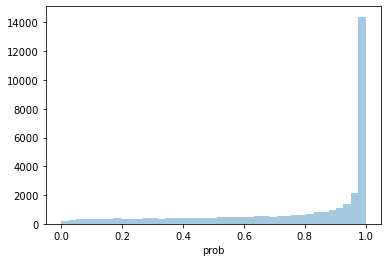

In [ ]:
ax = sns.distplot(train["prob"], kde=False)

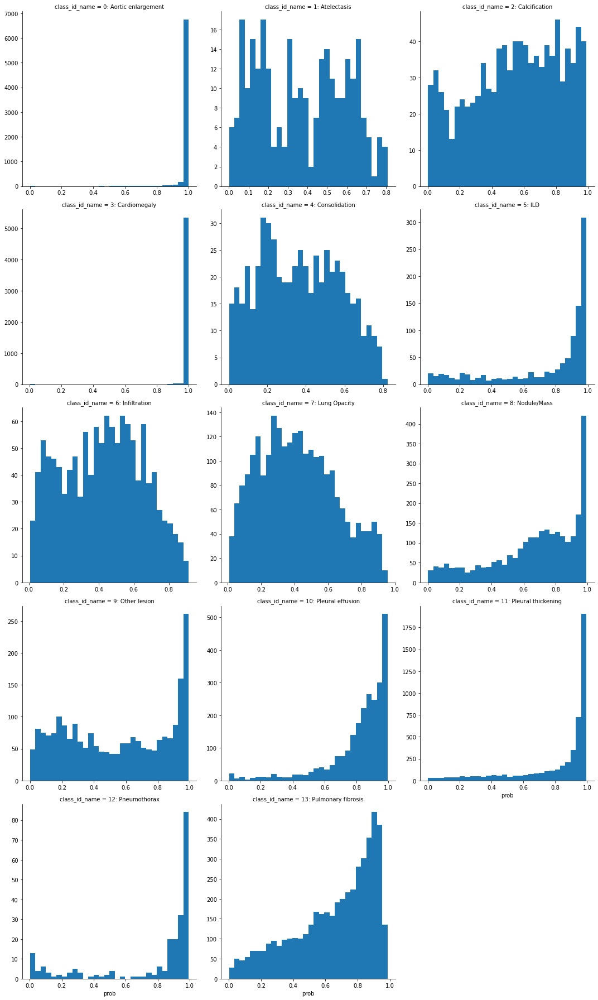

In [ ]:
#for class_id in range(7):
#    ax = sns.kdeplot(train.rename(columns={'prob':f'Class_{class_id}'}).loc[train['class_id']==class_id, f"Class_{class_id}"]);
#plt.ylim(0, 5);
#plt.xlim(0, 1);

train['class_id_name'] = [f'{class_id}: {class_name}' for class_id, class_name in zip(train['class_id'], train['class_name'])]
g = sns.FacetGrid(train.sort_values('class_id'), col='class_id_name', 
                  sharex=False, sharey=False,
                  col_wrap=3, height=5);
g.map(plt.hist, 'prob', bins=30);


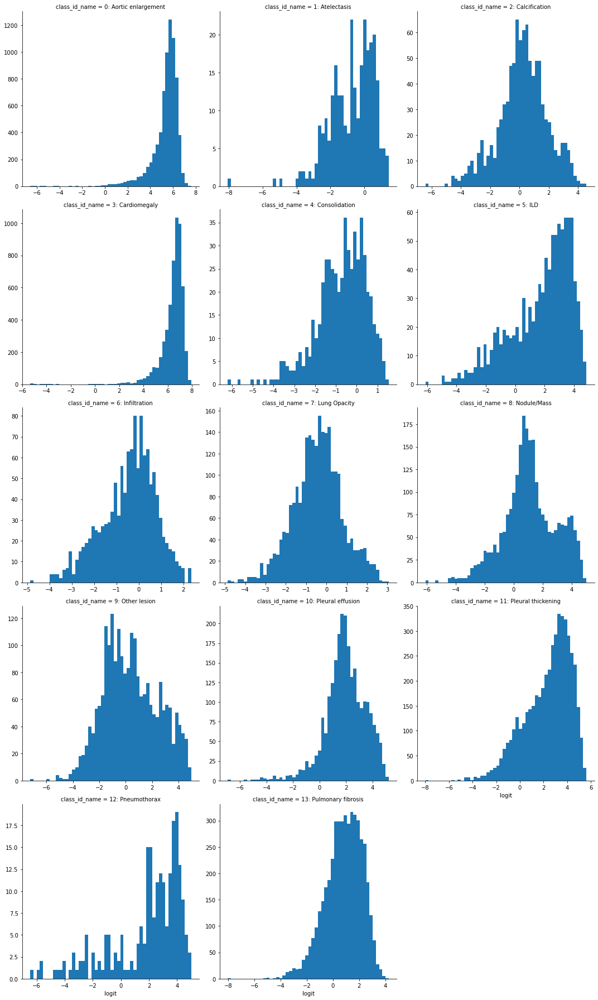

In [ ]:
train['logit'] = np.log(train['prob']) - np.log1p(-train['prob'])
g = sns.FacetGrid(train.sort_values('class_id'), col='class_id_name', 
                  sharex=False, sharey=False,
                  col_wrap=3, height=5);
g.map(plt.hist, 'logit', bins=50);

In [ ]:
train['flagged'] = ((train['class_id'].isin([0,3])) & (train['logit']< -2))\
    | ((train['class_id'].isin([1,2,4,5,7,9,11,13])) & (train['logit']< -6))\
    | ((train['class_id'].isin([6,8,10,12])) & (train['logit']< -5))

In [ ]:
train.to_csv('train_with_flags.csv', index=False)

In [ ]:
train[train['flagged']]

,Unnamed: 0,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,BitsAllocated,...,prob,first_pred,second_pred,alternative,first_prob,second_prob,alternative_prob,class_id_name,logit,flagged
114,114,6e4391555899c8474c4d32f42b2ba21b,Pneumothorax,12,R10,0.641909,0.183036,0.785432,0.325549,16,...,0.003192,13,6,13,0.862380,0.052553,0.862380,12: Pneumothorax,-5.743986,True
640,640,3ce8e5fe27fc9db53129cdbdd8de89de,Aortic enlargement,0,R8,0.354004,0.586400,0.798828,0.739200,16,...,0.001408,3,9,3,0.992615,0.003052,0.992615,0: Aortic enlargement,-6.564051,True
959,959,0d30dc1e0070e7a934f39452e3ad3b83,Pneumothorax,12,R10,0.179808,0.538396,0.744231,0.656997,16,...,0.002966,9,3,9,0.726072,0.213645,0.726072,12: Pneumothorax,-5.817560,True
1062,1062,e82620b01bbc77792885029d3cd0d8ae,Aortic enlargement,0,R9,0.357639,0.336111,0.415365,0.490278,16,...,0.015704,9,7,9,0.407770,0.306214,0.407770,0: Aortic enlargement,-4.138006,True
1122,1122,edc6ab1b2233143d011edf7706c32b6c,Aortic enlargement,0,R9,0.339440,0.661337,0.816810,0.770349,16,...,0.002407,3,0,3,0.994035,0.002407,0.994035,0: Aortic enlargement,-6.027017,True
1378,1378,b80be20a79e5a7539bd00f4907b444b2,Pulmonary fibrosis,13,R9,0.322047,0.434570,0.855512,0.619792,16,...,0.000323,3,9,3,0.997352,0.000509,0.997352,13: Pulmonary fibrosis,-8.038074,True
1526,1526,6d08a56a5d1e0918469413c81abc33bc,Pneumothorax,12,R8,0.290365,0.182292,0.373698,0.217014,16,...,0.003291,11,13,11,0.957782,0.017633,0.957782,12: Pneumothorax,-5.713416,True
3107,3107,d60854afebf749f87a8c95a07cb30d48,Cardiomegaly,3,R9,0.496094,0.227865,0.595052,0.326497,16,...,0.021129,0,3,0,0.955285,0.021129,0.955285,3: Cardiomegaly,-3.835743,True
4131,4131,43e96bafa84091eec856901f949efa05,Atelectasis,1,R10,0.492953,0.305147,0.602022,0.426471,16,...,0.000319,0,3,0,0.996517,0.000949,0.996517,1: Atelectasis,-8.049620,True
4197,4197,b293d02e9eb0ddf6f13ae424f3aec2b1,ILD,5,R9,0.372721,0.089844,0.444661,0.116536,16,...,0.002184,11,13,11,0.932012,0.027365,0.932012,5: ILD,-6.124340,True


# 3 SHAP

## 모델이 믿을 수 없다고 생각하는 경우에 대한 SHAP 설명 얻기

SHAP에 대해 자세히 알아 보려면 LightGBM 및 SHAP를 설명하는 [이 노트](https://www.kaggle.com/bjoernholzhauer/will-rose-or-jack-survive-lightgbm-and-shap)를 참조하세요.
<!--
# Getting SHAP explanations for cases the model considers implausible

To find out more about SHAP, have a look at [this notebook](https://www.kaggle.com/bjoernholzhauer/will-rose-or-jack-survive-lightgbm-and-shap) explaining LightGBM and SHAP.
-->


In [ ]:
explainer = shap.TreeExplainer(lgbfit)
shap_values = explainer.shap_values(train[cont_features].sample(n=10000, replace=False, random_state=42))

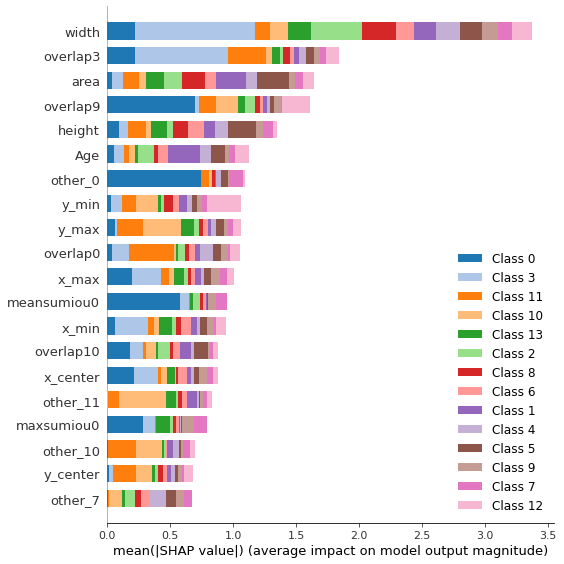

In [ ]:
# Color-scheme from http://www.randalolson.com/2014/06/28/how-to-make-beautiful-data-visualizations-in-python-with-matplotlib/
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),  
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),  
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),  
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),  
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]
for i in range(len(tableau20)):  
    r, g, b = tableau20[i]  
    tableau20[i] = (r / 255., g / 255., b / 255.)
    
shap.summary_plot(shap_values, 
                  train[cont_features], 
                  color=matplotlib.colors.ListedColormap(tableau20))

In [ ]:
flagged_idxs = np.where( train['flagged'] == True)[0]
flagged_idxs

array([  114,   640,   959,  1062,  1122,  1378,  1526,  3107,  4131,
        4197,  6096,  7571,  8044,  8126,  9004,  9138,  9673,  9804,
       12470, 14200, 14633, 16189, 16727, 17687, 18776, 21065, 21777,
       22277, 22342, 22957, 22981, 24134, 24294, 24418, 24886, 25002,
       25867, 26274, 29108, 29745, 30285, 30890, 32151, 35334, 36009])

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


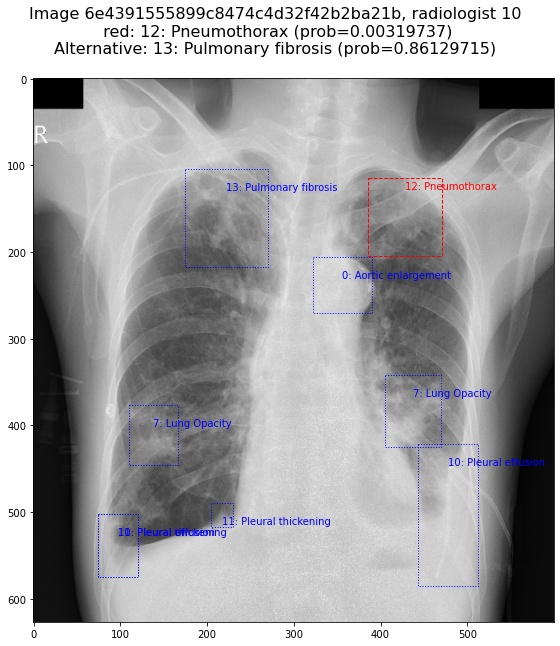

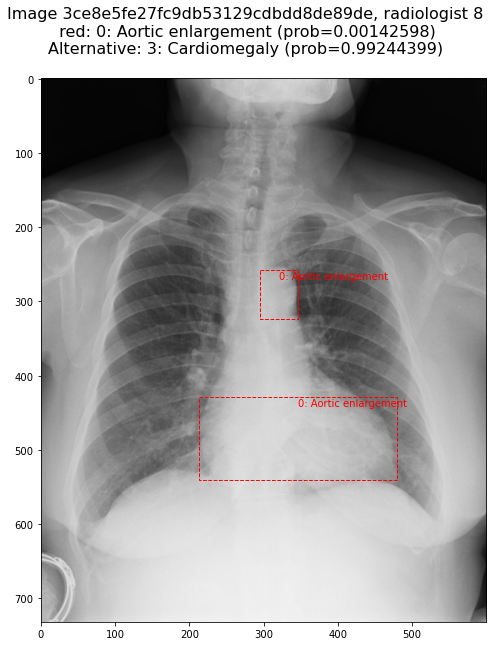

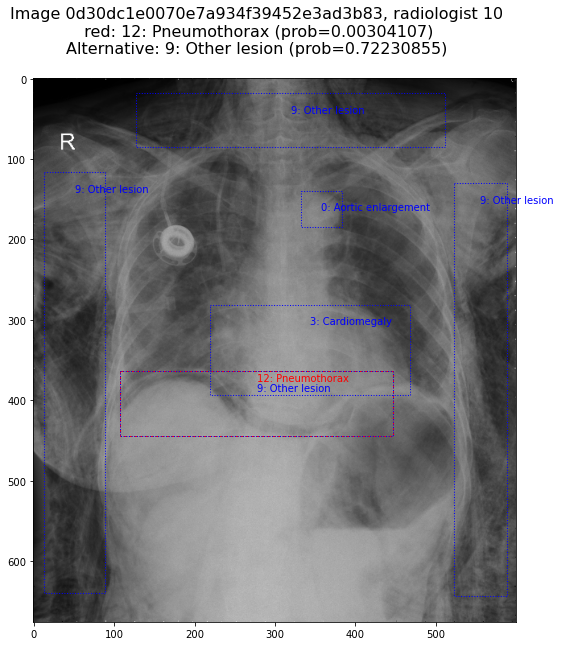

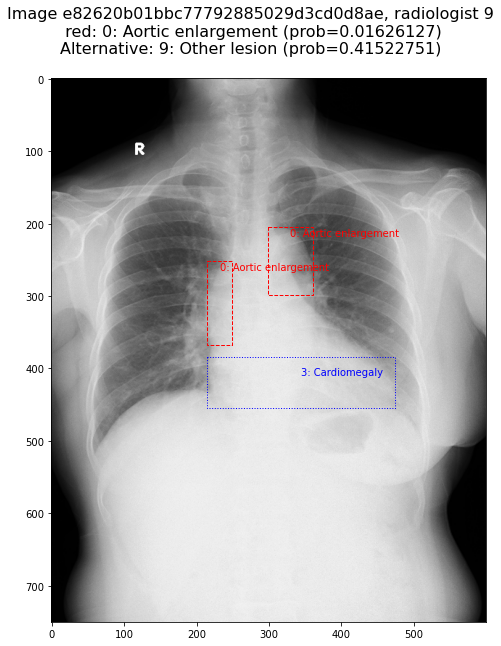

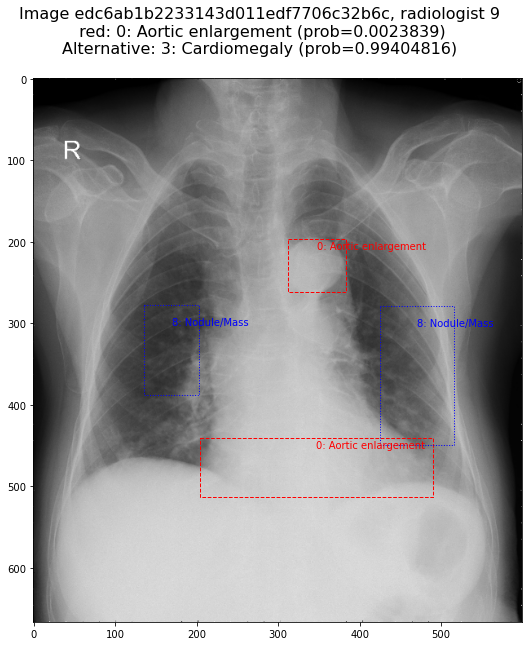

...

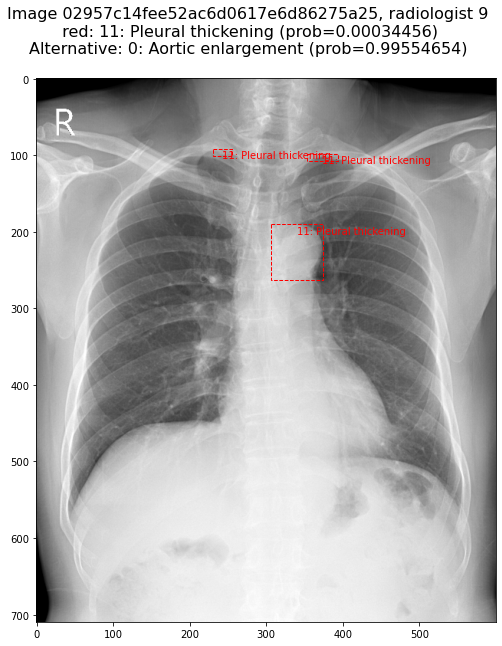

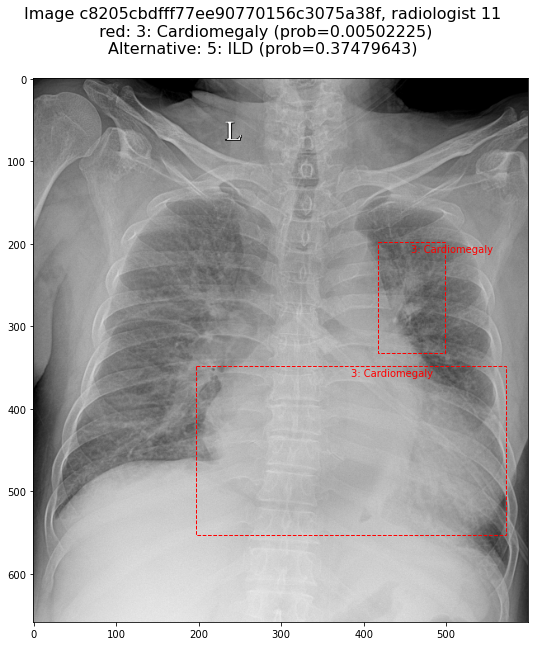

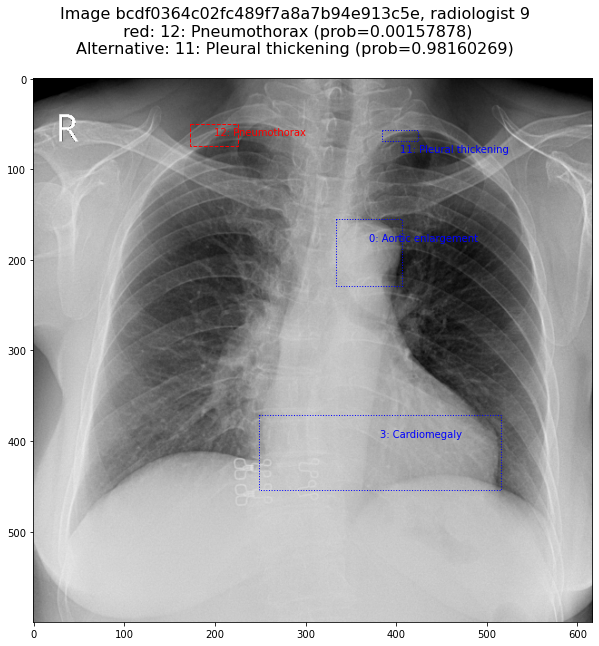

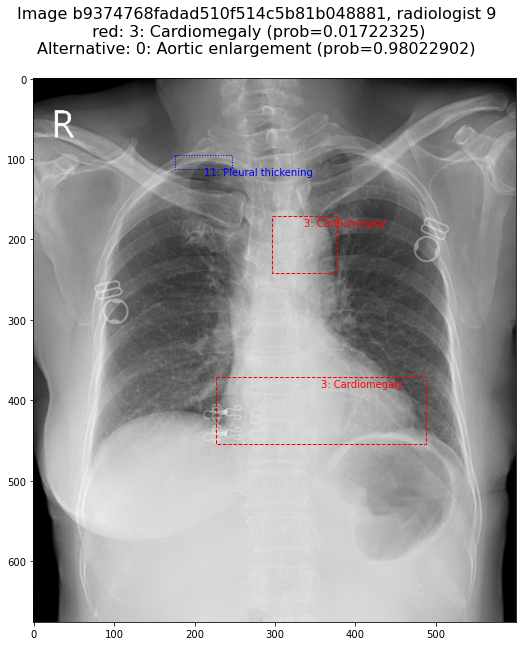

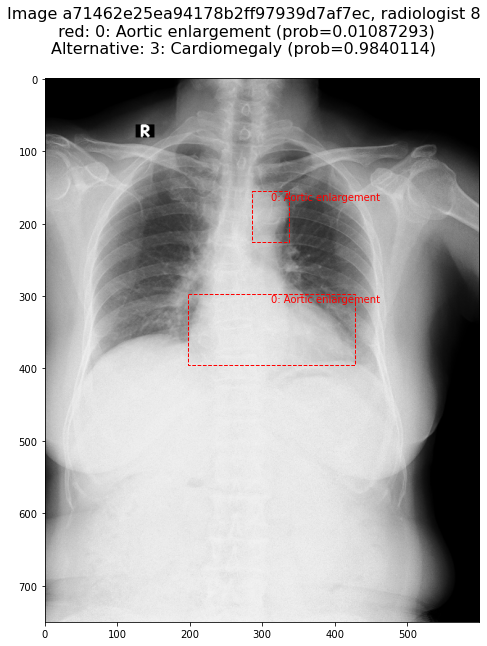

In [ ]:
def get_image(image_id, rad_id):
    with shelve.open('../input/eda-dicom-reading-vinbigdata-chest-x-ray/training_data.db', 
                     flag='r', writeback=False) as myshelf:
        tmpdict = myshelf[image_id]                        
    which_indices = [idx for idx, val in enumerate(tmpdict['rad_id']) if val==rad_id]
    image = np.stack([tmpdict['image']]*3).transpose(1,2,0)        
    bboxes = tmpdict['bboxes'][which_indices]
    class_labels = tmpdict['class_labels'][which_indices]        
    return {'image': image, 'bboxes': bboxes, 'class_labels': class_labels}

for index, row in train.loc[train['flagged'], 
                            ['image_id', 'rad_id', 'class_id', 
                             'class_name', 'prob', 'alternative', 'alternative_prob']]\
        .drop_duplicates()\
        .reset_index(drop=True)\
        .iterrows():
    image_id = row['image_id']    
    problem_class_id = row['class_id']
    problem_class = str(row['class_id']) + ": " + row['class_name']
    rad_id = int(re.findall(r'\d+', row['rad_id'])[0])
    im = get_image(image_id, rad_id)
    alternative = str(row['alternative']) + ": " + label_dict[row['alternative']]
    alt_prob = np.round(row['alternative_prob'],8)
    prob = np.round(row['prob'], 8)

    plt.figure(figsize=(20,10));    
    plt.imshow(im['image']);
    plt.suptitle(f'Image {image_id}, radiologist {rad_id}\n red: {problem_class} (prob={prob})\nAlternative: {alternative} (prob={alt_prob})', fontsize=16)    
    ax = plt.gca();

    for bbox, class_id in zip(im['bboxes'], im['class_labels']):
        #print(f'{image_id}, {rad_id}, {bbox}, {class_id}')        
        if class_id==problem_class_id: 
            ecol='r'
            linestyle = 'dashed'
            offset=12
        else:
            ecol='b'
            linestyle = 'dotted'
            offset=24

        # Create a Rectangle patch
        rect = Rectangle((bbox[0],bbox[1]),bbox[2]-bbox[0],bbox[3]-bbox[1],
                         linewidth=1,linestyle=linestyle,
                         edgecolor=ecol,facecolor='none');
        # Add the patch to the Axes
        ax.add_patch(rect);
        ax.annotate(str(class_id) + ': ' + label_dict[class_id], 
                    xy=((bbox[2]+bbox[0])/2, bbox[1]+offset), 
                    xycoords='data', color=ecol);

## 예측에 대한 개별 설명
모델 예측에 대한 20 개의 특정 SHAP 설명도 살펴 보겠습니다.
<!--
# Individual explanations for predictions
Let's also look at 20 specific SHAP explanations for model predictions:
-->


In [ ]:
shap.initjs()
def shap_explain_flgidx(flgidx):
    print(train.iloc[flgidx])
    class_id = train.iloc[flgidx]['class_id']
    return shap.force_plot(explainer.expected_value[class_id],
                shap_values[class_id][flgidx],
                train[cont_features].iloc[flgidx])

In [ ]:
shap_explain_flgidx(flagged_idxs[0])

image_id            6e4391555899c8474c4d32f42b2ba21b
class_name                              Pneumothorax
class_id                                          12
rad_id                                           R10
x_min                                       0.641909
                                  ...               
second_prob                                0.0530703
alternative_prob                            0.861297
class_id_name                       12: Pneumothorax
logit                                       -5.74222
flagged                                         True
Name: 114, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[1])

image_id            3ce8e5fe27fc9db53129cdbdd8de89de
class_name                        Aortic enlargement
class_id                                           0
rad_id                                            R8
x_min                                       0.354004
                                  ...               
second_prob                               0.00318039
alternative_prob                            0.992444
class_id_name                  0: Aortic enlargement
logit                                       -6.55147
flagged                                         True
Name: 640, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[2])

image_id            0d30dc1e0070e7a934f39452e3ad3b83
class_name                              Pneumothorax
class_id                                          12
rad_id                                           R10
x_min                                       0.179808
                                  ...               
second_prob                                 0.216908
alternative_prob                            0.722309
class_id_name                       12: Pneumothorax
logit                                        -5.7925
flagged                                         True
Name: 959, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[3])

image_id            e82620b01bbc77792885029d3cd0d8ae
class_name                        Aortic enlargement
class_id                                           0
rad_id                                            R9
x_min                                       0.357639
                                  ...               
second_prob                                 0.302611
alternative_prob                            0.415228
class_id_name                  0: Aortic enlargement
logit                                       -4.10257
flagged                                         True
Name: 1062, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[4])

image_id            edc6ab1b2233143d011edf7706c32b6c
class_name                        Aortic enlargement
class_id                                           0
rad_id                                            R9
x_min                                        0.33944
                                  ...               
second_prob                                0.0023839
alternative_prob                            0.994048
class_id_name                  0: Aortic enlargement
logit                                       -6.03663
flagged                                         True
Name: 1122, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[5])

image_id            b80be20a79e5a7539bd00f4907b444b2
class_name                        Pulmonary fibrosis
class_id                                          13
rad_id                                            R9
x_min                                       0.322047
                                  ...               
second_prob                              0.000503889
alternative_prob                            0.997367
class_id_name                 13: Pulmonary fibrosis
logit                                       -8.02489
flagged                                         True
Name: 1378, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[6])

image_id            6d08a56a5d1e0918469413c81abc33bc
class_name                              Pneumothorax
class_id                                          12
rad_id                                            R8
x_min                                       0.290365
                                  ...               
second_prob                                0.0175741
alternative_prob                            0.957686
class_id_name                       12: Pneumothorax
logit                                       -5.70784
flagged                                         True
Name: 1526, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[7])

image_id            d60854afebf749f87a8c95a07cb30d48
class_name                              Cardiomegaly
class_id                                           3
rad_id                                            R9
x_min                                       0.496094
                                  ...               
second_prob                                0.0204429
alternative_prob                            0.956254
class_id_name                        3: Cardiomegaly
logit                                       -3.86947
flagged                                         True
Name: 3107, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[8])

image_id            43e96bafa84091eec856901f949efa05
class_name                               Atelectasis
class_id                                           1
rad_id                                           R10
x_min                                       0.492953
                                  ...               
second_prob                              0.000950805
alternative_prob                            0.996489
class_id_name                         1: Atelectasis
logit                                       -8.04493
flagged                                         True
Name: 4131, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[9])

image_id            b293d02e9eb0ddf6f13ae424f3aec2b1
class_name                                       ILD
class_id                                           5
rad_id                                            R9
x_min                                       0.372721
                                  ...               
second_prob                                0.0276736
alternative_prob                            0.931593
class_id_name                                 5: ILD
logit                                       -6.15417
flagged                                         True
Name: 4197, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[10])

image_id            dff6766d2464bfe77de7f6f19edbf51a
class_name                               Nodule/Mass
class_id                                           8
rad_id                                           R10
x_min                                       0.237402
                                  ...               
second_prob                                  0.39472
alternative_prob                            0.462811
class_id_name                         8: Nodule/Mass
logit                                       -5.36183
flagged                                         True
Name: 6096, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[11])

image_id            f4283460f9f2e254b8b048ce635f1276
class_name                          Pleural effusion
class_id                                          10
rad_id                                            R9
x_min                                        0.29006
                                  ...               
second_prob                                0.0131899
alternative_prob                            0.970391
class_id_name                   10: Pleural effusion
logit                                        -6.8814
flagged                                         True
Name: 7571, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[12])

image_id            8eb496d5dd817b996672eab35e7de8f4
class_name                              Cardiomegaly
class_id                                           3
rad_id                                            R9
x_min                                        0.60026
                                  ...               
second_prob                                0.0171199
alternative_prob                            0.960933
class_id_name                        3: Cardiomegaly
logit                                       -4.05024
flagged                                         True
Name: 8044, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[13])

image_id            1b2a7adb5705d9e3f5b63939046d93c7
class_name                              Cardiomegaly
class_id                                           3
rad_id                                            R8
x_min                                       0.561297
                                  ...               
second_prob                                 0.237173
alternative_prob                            0.382441
class_id_name                        3: Cardiomegaly
logit                                       -4.37655
flagged                                         True
Name: 8126, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[14])

image_id            6ed2ab0e4ba47734a7b2a47deff243c1
class_name                              Cardiomegaly
class_id                                           3
rad_id                                            R9
x_min                                            0.5
                                  ...               
second_prob                                0.0127829
alternative_prob                            0.977964
class_id_name                        3: Cardiomegaly
logit                                       -4.34678
flagged                                         True
Name: 9004, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[15])

image_id            a3edf89d922032beef7cf3484ab9fe54
class_name                        Aortic enlargement
class_id                                           0
rad_id                                            R9
x_min                                       0.611545
                                  ...               
second_prob                                0.0856757
alternative_prob                              0.5961
class_id_name                  0: Aortic enlargement
logit                                       -2.93593
flagged                                         True
Name: 9138, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[16])

image_id            0d30dc1e0070e7a934f39452e3ad3b83
class_name                               Nodule/Mass
class_id                                           8
rad_id                                            R8
x_min                                       0.564904
                                  ...               
second_prob                                0.0228744
alternative_prob                            0.944056
class_id_name                         8: Nodule/Mass
logit                                       -5.34447
flagged                                         True
Name: 9673, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[17])

image_id            2c42c054b21c3a7ff91f13e3b43e5418
class_name                        Aortic enlargement
class_id                                           0
rad_id                                           R10
x_min                                        0.37435
                                  ...               
second_prob                               0.00556322
alternative_prob                             0.99073
class_id_name                  0: Aortic enlargement
logit                                         -5.186
flagged                                         True
Name: 9804, Length: 208, dtype: object


In [ ]:
shap_explain_flgidx(flagged_idxs[18])

image_id            d513454347dd168afa0b6bb6c328a2ee
class_name                              Cardiomegaly
class_id                                           3
rad_id                                           R11
x_min                                       0.476893
                                  ...               
second_prob                                0.0178136
alternative_prob                            0.964499
class_id_name                        3: Cardiomegaly
logit                                       -4.00982
flagged                                         True
Name: 12470, Length: 208, dtype: object


IndexError: index 12470 is out of bounds for axis 0 with size 10000

In [ ]:
shap_explain_flgidx(flagged_idxs[19])

image_id            a43d700412de5ab25b800bd283e1baa2
class_name                        Aortic enlargement
class_id                                           0
rad_id                                            R9
x_min                                       0.333496
                                  ...               
second_prob                               0.00133967
alternative_prob                            0.997266
class_id_name                  0: Aortic enlargement
logit                                       -6.61399
flagged                                         True
Name: 14200, Length: 208, dtype: object


IndexError: index 14200 is out of bounds for axis 0 with size 10000